# Your plant Copilot with GPT4-V
## GPT-4 with Vision demo with Azure Open AI - Plants

GPT-4 Turbo with Vision on Azure OpenAI service is now in public preview. GPT-4 Turbo with Vision is a large multimodal model (LMM) developed by OpenAI that can analyze images and provide textual responses to questions about them.
It incorporates both natural language processing and visual understanding. With enhanced mode, you can use the Azure AI Vision features to generate additional insights from the images.

> https://learn.microsoft.com/en-us/azure/ai-services/openai/whats-new#gpt-4-turbo-with-vision-now-available

<img src="plants/image.png">

In [1]:
# %pip install openai --upgrade

In [2]:
import base64
import datetime
import glob
import gradio as gr
import json
import openai
import os
import requests
import sys

from dotenv import load_dotenv
from io import BytesIO
from PIL import Image

In [3]:
def check_openai_version():
    """
    Check Azure Open AI version
    """
    installed_version = openai.__version__

    try:
        version_number = float(installed_version[:3])
    except ValueError:
        print("Invalid OpenAI version format")
        return

    print(f"Installed OpenAI version: {installed_version}")

    if version_number < 1.0:
        print("[Warning] You should upgrade OpenAI to have version >= 1.0.0")
        print("To upgrade, run: %pip install openai --upgrade")
    else:
        print(f"[OK] OpenAI version {installed_version} is >= 1.0.0")

In [4]:
check_openai_version()

Installed OpenAI version: 1.3.8
[OK] OpenAI version 1.3.8 is >= 1.0.0


In [5]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [6]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 18-Dec-2023 08:26:53


In [7]:
print(f"Python version: {sys.version}")

Python version: 3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]


## 1. Azure Open AI

In [8]:
print(f"OpenAI version: {openai.__version__}")

OpenAI version: 1.3.8


In [9]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
openai.api_key = os.getenv("OPENAI_API_KEY")
openai.api_base = os.getenv("OPENAI_API_BASE")

In [10]:
model = "GPT4Vision"  # This is the deployed name of your GPT4 Vision model from the Azure Open AI studio

## 2. Functions

In [11]:
def image_view(image_file):
    """
    View image
    """
    if not os.path.exists(image_file):
        print(f"[Error] Image file {image_file} does not exist.")
        return None

    else:
        print(image_file)
        img = Image.open(image_file)
        display(img)

In [12]:
def gpt4V_plant(image_file):
    """
    GPT4-Vision
    """
    # Checking if file exists
    if not os.path.exists(image_file):
        print(f"[Error] Image file {image_file} does not exist.")
        return None

    # Endpoint
    base_url = f"{openai.api_base}/openai/deployments/{model}"
    gpt4vision_endpoint = f"{base_url}/chat/completions?api-version=2023-12-01-preview"

    # Header
    headers = {"Content-Type": "application/json", "api-key": openai.api_key}

    # Encoded image
    base_64_encoded_image = base64.b64encode(open(image_file, "rb").read()).decode(
        "ascii"
    )

    context = """ 
    You are a plant and flowers expert, familiar with identifying plants and flowers from images.
    A user uploads an image and asks you to describe one particular piece in the shot: flowers, plants...
    """

    prompt = """
    You respond with your analysis of the following fields:

    1. ITEM'S TYPE: Identify the plant species.
    2. COLOR: Note the main color(s) and any secondary colors of the plant.
    3. COUNTRIES: Identify the country where this plant came from.
    4. WATER: Identify the water preferences of this plant.
    5. SUN: Identify the light preference of this plant.
    6. TEMPERATURE: Identify the best temperature for this plant.
    7. FERTILIZATION: What about fertilization?
    8. DISEASE: What are the main diseases for this plant?
    9. SOIL: What is the best soil?
    10. SOIL PH: What is the best soil PH?
    11. FLOWERING: What is the flowering period?
    12. TOXICITY: What is the toxicity?
    13. ITEM TYPE SPECIFIC: For each type of item, feel free to add any additional descriptions that are relevant \
    to help describe the item.
    14. MISC.: Anything else important that you notice about the plant.
    15. SIZE: What is the usual size of this plant?
    16. ITEM SUMMARY: Write a one-line summary for this item.
    17. ITEM CLASSIFICATION: Classify this item into "plant for beginners", "plant that needs attention", \
    "plant for experts".
    18. ITEM TAGS: Generate 10 tags to describe this plant. Each tag should be separated with a comma.
    19. STORIES: Write multiple stories about this plant in 5 lines.
    20. TWEETER PUBLICATION: Write a tweeter ad for this plant with some hashtags and emojis.
    21. ECOMMERCE AD: Generate a plant description for a publication on an ecommerce website with a selling message.
    22. FRENCH ECOMMERCE AD: Generate a plant description in French for a publication on an ecommerce website with \
    a selling message.

    The output should be a numbered bulleted list.
    """

    # Prompt
    json_data = {
        "messages": [
            {"role": "system", "content": context},
            {"role": "user", "content": [prompt, {"image": base_64_encoded_image}]},
        ],
        "max_tokens": 4000,
        "temperature": 0.7,
    }

    # Results
    response = requests.post(
        gpt4vision_endpoint, headers=headers, data=json.dumps(json_data)
    )

    if response.status_code == 200:
        now = str(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"))
        print(f"Analysis of image: {image_file}")
        resp = json.loads(response.text)["choices"][0]["message"]["content"]
        print("\033[1;31;34m")
        print(resp)
        print("\n\033[1;31;32mDone:", now)
        print(
            "\033[1;31;32m[Note] These results are generated by an AI (Azure Open AI GPT4-Vision)"
        )

    elif response.status_code == 429:
        print(
            "[429 Error] Too many requests. Please wait a couple of seconds and try again."
        )

    else:
        print("[Error] Error code:", response.status_code)

## 3. Examples

plants/plant1.png


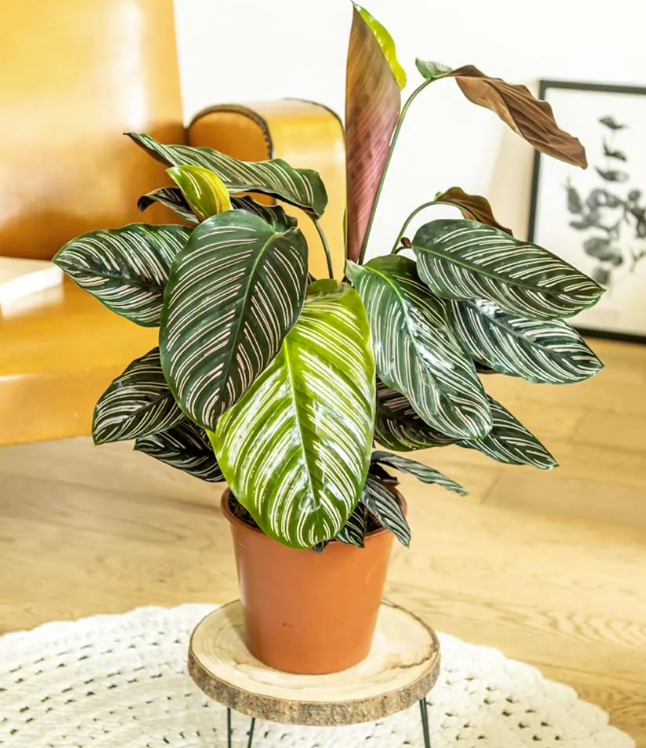

In [15]:
image_file = "plants/plant1.png"

image_view(image_file)

In [16]:
gpt4V_plant(image_file)

Analysis of image: plants/plant1.png

1. ITEM'S TYPE: Calathea ornata, commonly known as Pinstripe Calathea.
2. COLOR: Dark green leaves with bright pink stripes.
3. COUNTRIES: Native to South America, particularly Columbia and Venezuela.
4. WATER: Prefers consistent moisture; does not like to be overwatered or completely dry out.
5. SUN: Prefers medium to low indirect light.
6. TEMPERATURE: Thrives in temperatures between 65-75°F (18-24°C).
7. FERTILIZATION: Fertilize during the growing season with a balanced liquid fertilizer every month.
8. DISEASE: Prone to root rot if overwatered, and spider mites in dry conditions.
9. SOIL: Well-draining potting soil with good organic content.
10. SOIL PH: Prefers slightly acidic to neutral pH (6.5 to 7.5).
11. FLOWERING: Rarely flowers indoors, but when it does, it produces small white or purple flowers in the summer.
12. TOXICITY: Non-toxic to pets and humans.
13. ITEM TYPE SPECIFIC: Known for its beautiful foliage and air-purifying abilities.


### Another example

plants/plant2.jpg


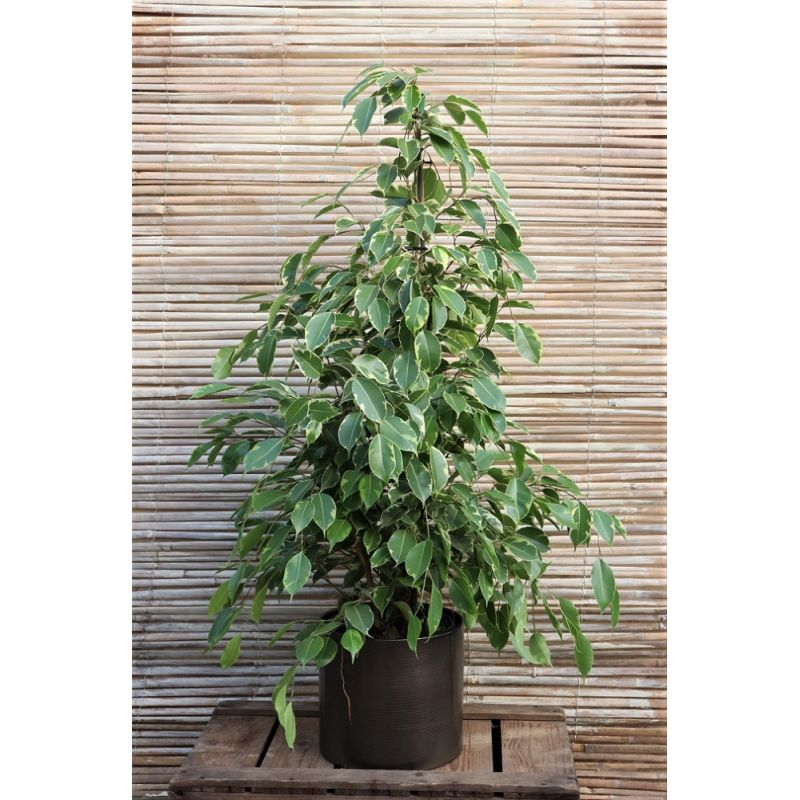

In [39]:
image_file = "plants/plant2.jpg"

image_view(image_file)

In [40]:
gpt4V_plant(image_file)

Analysis of image: plants/plant2.jpg

1. ITEM'S TYPE: Ficus benjamina, commonly known as the Weeping Fig.
2. COLOR: The leaves are a glossy dark green with light green to cream edges.
3. COUNTRIES: Native to Asia and Australia.
4. WATER: Prefers consistently moist soil; water when the top inch of soil becomes dry.
5. SUN: Bright, indirect sunlight is ideal.
6. TEMPERATURE: Thrives in temperatures between 60-75°F (16-24°C).
7. FERTILIZATION: Feed with a general-purpose liquid fertilizer monthly during the growing season.
8. DISEASE: Susceptible to leaf drop, root rot, and pests like scale insects and mealybugs.
9. SOIL: Well-draining potting soil is recommended.
10. SOIL PH: Prefers a slightly acidic to neutral pH, around 6.0 to 6.5.
11. FLOWERING: Rarely flowers indoors; insignificant small flowers if it does.
12. TOXICITY: Toxic to pets if ingested.
13. ITEM TYPE SPECIFIC: Known for its air-purifying abilities and elegant, drooping branches.
14. MISC.: Sensitive to changes in its envi

### Another example

plants/plant3.jpg


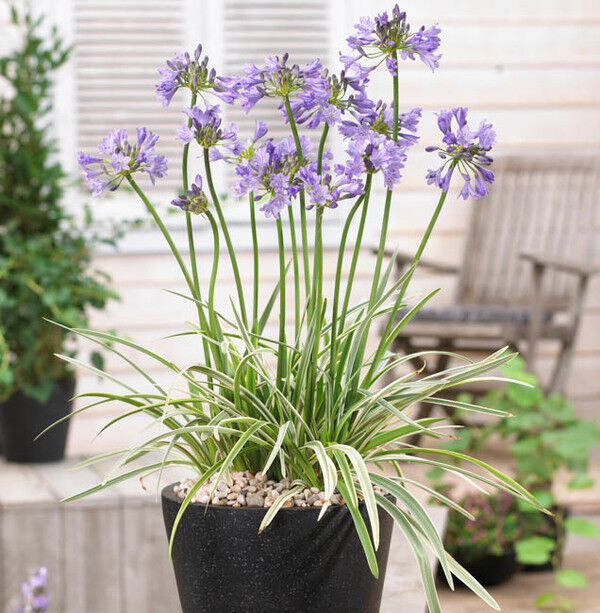

In [19]:
image_file = "plants/plant3.jpg"

image_view(image_file)

In [20]:
gpt4V_plant(image_file)

Analysis of image: plants/plant3.jpg

1. ITEM'S TYPE: Agapanthus praecox, commonly known as the African Lily or Lily of the Nile.
2. COLOR: Mainly violet-blue flowers with green foliage, some variegation on the leaves.
3. COUNTRIES: Native to South Africa.
4. WATER: Prefers consistent watering but can tolerate drought once established.
5. SUN: Full sun to partial shade.
6. TEMPERATURE: Hardy in USDA zones 8-11, prefers a warmer climate.
7. FERTILIZATION: Benefits from regular feeding during the growing season.
8. DISEASE: Can be susceptible to root rot if overwatered, and snails/slugs may be an issue.
9. SOIL: Well-draining soil is essential.
10. SOIL PH: Prefers slightly acidic to neutral soil pH (6.0-7.0).
11. FLOWERING: Blooms in summer to early fall.
12. TOXICITY: All parts of the plant are toxic if ingested.
13. ITEM TYPE SPECIFIC: Agapanthus praecox has strap-like leaves and a clump-forming habit, with tall flower stalks topped with umbels of trumpet-shaped flowers.
14. MISC.: To

### Another example

plants/plant4.jpg


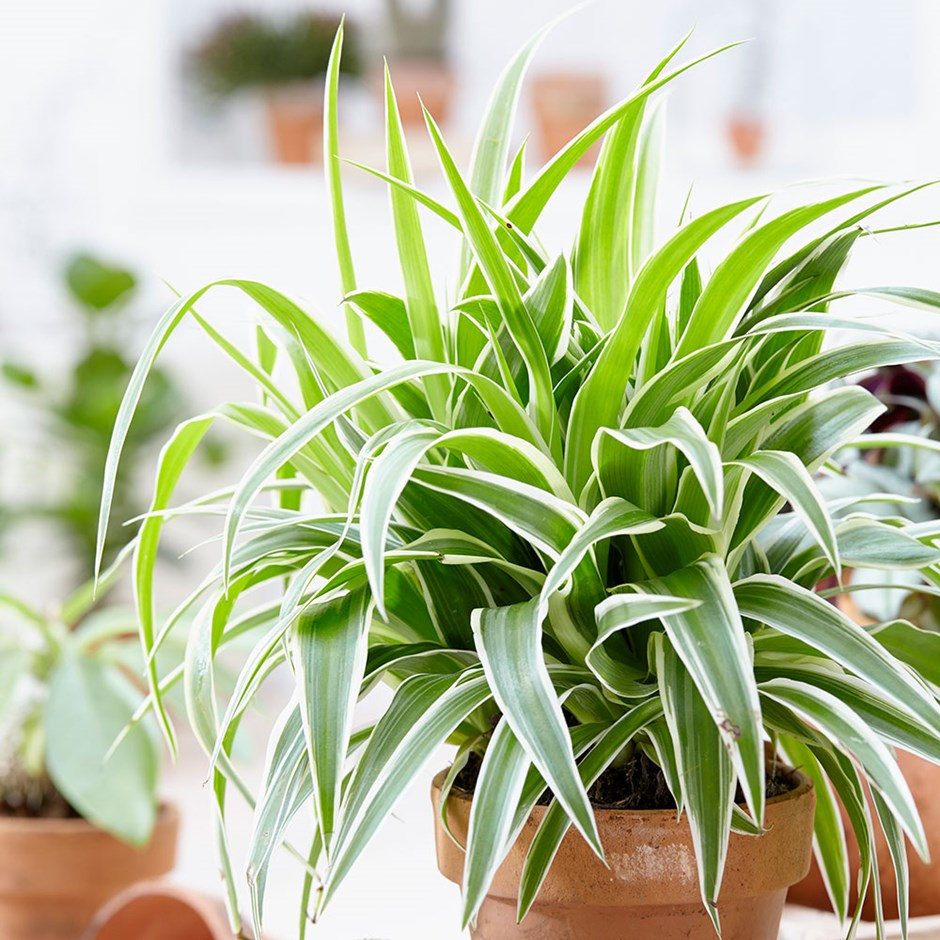

In [21]:
image_file = "plants/plant4.jpg"

image_view(image_file)

In [22]:
gpt4V_plant(image_file)

Analysis of image: plants/plant4.jpg

1. ITEM'S TYPE: This is a Spider Plant, scientifically known as Chlorophytum comosum.
2. COLOR: The main colors are green with white stripes running along the length of the leaves.
3. COUNTRIES: This plant is native to tropical and southern Africa.
4. WATER: Prefers evenly moist soil; water thoroughly but allow the top inch of soil to dry out between waterings.
5. SUN: Prefers bright, indirect sunlight but can tolerate low light conditions.
6. TEMPERATURE: Thrives in temperatures between 65-75°F (18-24°C).
7. FERTILIZATION: Feed monthly during the spring and summer with a balanced liquid fertilizer diluted by half.
8. DISEASE: Can be prone to root rot if overwatered, and spider mites in dry conditions.
9. SOIL: A well-draining potting mix is ideal.
10. SOIL PH: Prefers slightly acidic to neutral soil, around pH 6.0-7.2.
11. FLOWERING: Blooms in mid-summer, though houseplants rarely flower.
12. TOXICITY: Non-toxic to cats and dogs.
13. ITEM TYPE SPE

### Another example

plants/plant5.png


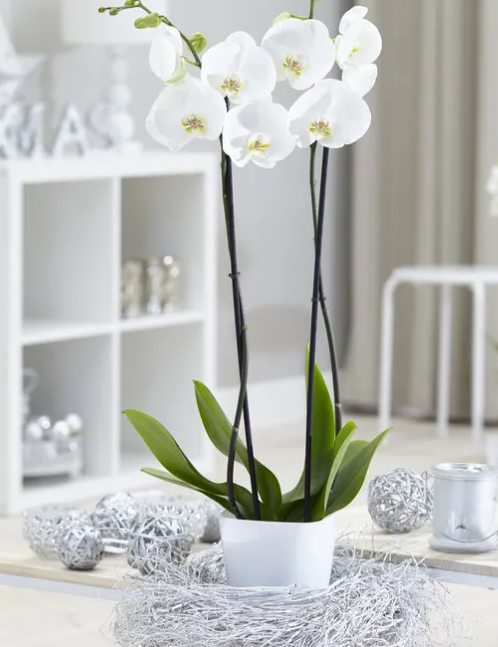

In [23]:
image_file = "plants/plant5.png"

image_view(image_file)

In [24]:
gpt4V_plant(image_file)

Analysis of image: plants/plant5.png

1. ITEM'S TYPE: Phalaenopsis orchid (commonly known as moth orchid).
2. COLOR: Mainly white with a yellow center and slight pinkish or purplish spots on the inner part of the petals.
3. COUNTRIES: Native to southern China, Taiwan, the Indian Subcontinent, Southeast Asia, New Guinea, the Bismarck Archipelago, and Queensland.
4. WATER: Prefers consistent moisture but should not be waterlogged; allow the top inch of soil to dry out between waterings.
5. SUN: Thrives in bright, indirect sunlight.
6. TEMPERATURE: Enjoys a warm environment, ideally between 65°F and 80°F (18°C to 27°C).
7. FERTILIZATION: Fertilize weakly (quarter strength) weekly during the growing season.
8. DISEASE: Susceptible to root rot, bacterial and fungal infections if overwatered or improperly ventilated.
9. SOIL: Best grown in well-draining orchid potting mix.
10. SOIL PH: Slightly acidic to neutral pH (6.0 to 7.0).
11. FLOWERING: Can bloom at any time of the year but typically 

### Another example

plants/plant6.png


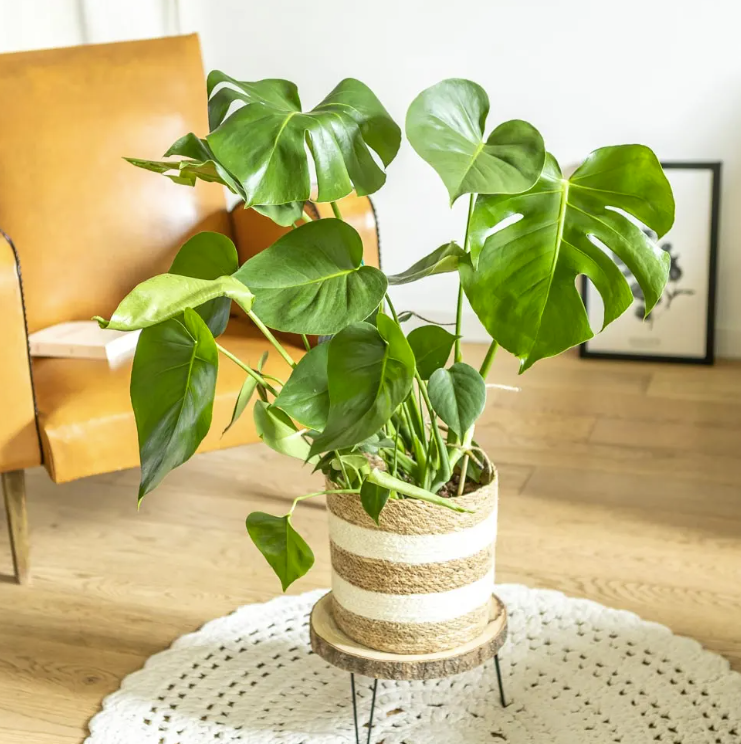

In [25]:
image_file = "plants/plant6.png"

image_view(image_file)

In [26]:
gpt4V_plant(image_file)

Analysis of image: plants/plant6.png

1. ITEM'S TYPE: Monstera deliciosa, commonly known as the Swiss Cheese Plant.
2. COLOR: Deep green.
3. COUNTRIES: Native to the tropical forests of southern Mexico, south to Panama.
4. WATER: Prefers high humidity and moist soil but not waterlogged.
5. SUN: Thrives in bright to medium indirect light, but can tolerate low indirect light.
6. TEMPERATURE: Ideal temperatures range between 65°F and 85°F (18°C - 29°C).
7. FERTILIZATION: Likes a balanced, water-soluble fertilizer every few months during the growing season.
8. DISEASE: Susceptible to root rot if overwatered and can attract mealybugs and spider mites.
9. SOIL: Well-draining potting mix.
10. SOIL PH: Prefers slightly acidic to neutral soil (pH 5.5 to 7.0).
11. FLOWERING: Rarely flowers indoors; if it does, it blooms with a white spathe and spadix.
12. TOXICITY: Toxic to cats and dogs if ingested due to calcium oxalates.
13. ITEM TYPE SPECIFIC: Known for its large, glossy, perforated leaves, 

### Another example

plants/plant7.png


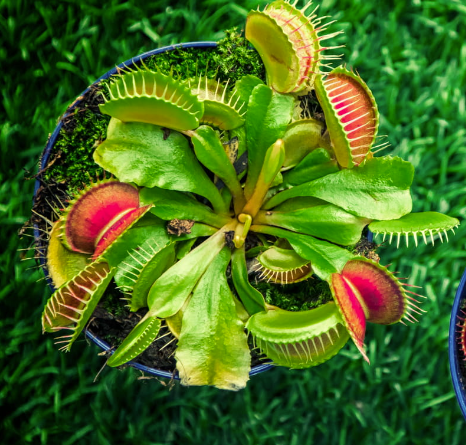

In [27]:
image_file = "plants/plant7.png"

image_view(image_file)

In [28]:
gpt4V_plant(image_file)

Analysis of image: plants/plant7.png

1. ITEM'S TYPE: This is a Venus Flytrap (Dionaea muscipula).
2. COLOR: The main colors are green and red, with the red coloration mostly on the inner parts of the traps.
3. COUNTRIES: Native to subtropical wetlands on the East Coast of the United States in North Carolina and South Carolina.
4. WATER: Prefers distilled water, rainwater, or water that is low in minerals. The soil should be kept moist but not waterlogged.
5. SUN: Requires full sun to bright, indirect sunlight.
6. TEMPERATURE: Thrives in warm temperatures, around 70°F to 95°F during the day and 55°F to 65°F at night.
7. FERTILIZATION: Generally does not require fertilization; it obtains nutrients from its prey.
8. DISEASE: Can be susceptible to fungal infections if conditions are too moist or if there is poor air circulation.
9. SOIL: Prefers a mix of sphagnum peat moss and sand or perlite, without added fertilizers or nutrients.
10. SOIL PH: Acidic, typically between 5.0 and 6.5.
11. 

### Another example

plants/plant8.png


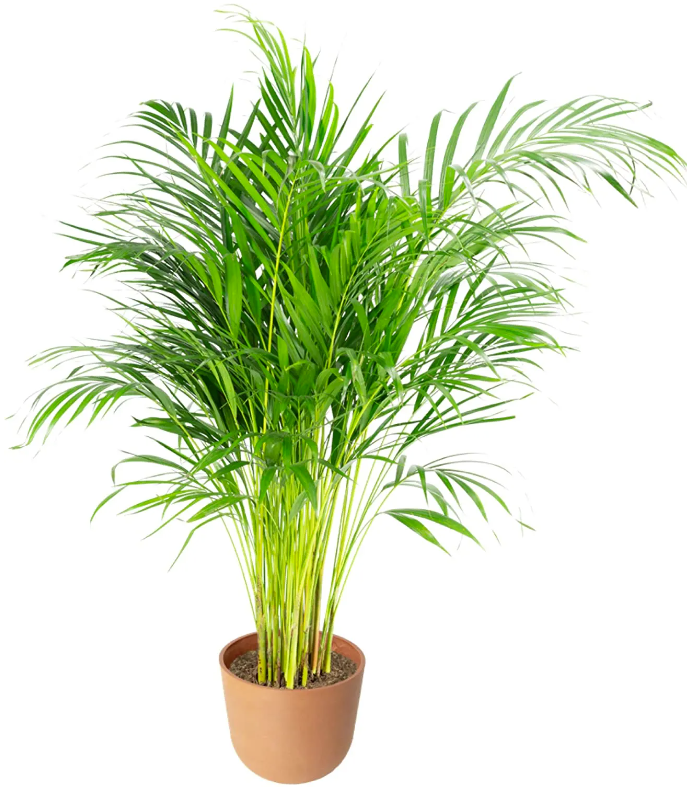

In [29]:
image_file = "plants/plant8.png"

image_view(image_file)

In [30]:
gpt4V_plant(image_file)

Analysis of image: plants/plant8.png

1. ITEM'S TYPE: This is a Parlor Palm (Chamaedorea elegans).
2. COLOR: Mainly green with some yellowish-green tones near the base of the stalks.
3. COUNTRIES: Native to Mexico and Guatemala.
4. WATER: Prefers moist soil but can tolerate drought. Water when the top inch of soil feels dry.
5. SUN: Prefers bright, indirect light but can adapt to low light conditions.
6. TEMPERATURE: Thrives in temperatures between 65-80°F (18-27°C).
7. FERTILIZATION: Fertilize sparingly, about once or twice during the growing season.
8. DISEASE: Can be susceptible to spider mites and mealybugs.
9. SOIL: Well-draining potting mix.
10. SOIL PH: Prefers slightly acidic to neutral pH (5.5 to 7.5).
11. FLOWERING: Rarely flowers indoors; blooms with small yellow flowers when it does.
12. TOXICITY: Non-toxic to pets and humans.
13. ITEM TYPE SPECIFIC: This plant is known for its air-purifying qualities and its ability to thrive in indoor environments.
14. MISC.: It's a popul

### Another example

plants/plant9.jpg


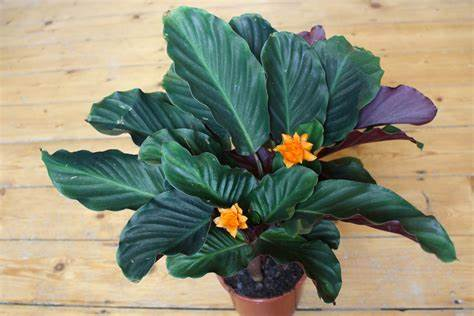

In [31]:
image_file = "plants/plant9.jpg"

image_view(image_file)

In [32]:
gpt4V_plant(image_file)

Analysis of image: plants/plant9.jpg

1. ITEM'S TYPE: This is a Calathea crocata, also known as the Eternal Flame plant.
2. COLOR: The main colors are dark green leaves with a velvety texture, and the flowers are bright orange.
3. COUNTRIES: Native to Brazil.
4. WATER: Prefers consistent moisture but not waterlogging.
5. SUN: Thrives in low to medium indirect light.
6. TEMPERATURE: Prefers temperatures between 65°F and 80°F (18°C and 27°C).
7. FERTILIZATION: Fertilize monthly during the growing season with a balanced fertilizer.
8. DISEASE: Susceptible to spider mites and root rot if overwatered.
9. SOIL: Well-draining potting mix.
10. SOIL PH: Prefers slightly acidic to neutral pH.
11. FLOWERING: Blooms in late winter or early spring.
12. TOXICITY: Non-toxic to pets and humans.
13. ITEM TYPE SPECIFIC: The leaves fold up slightly during the night time, a behavior known as nyctinasty.
14. MISC.: Calathea crocata is known for its striking leaves that are attractive even when the plant is

### Another example

plants/plant10.jpg


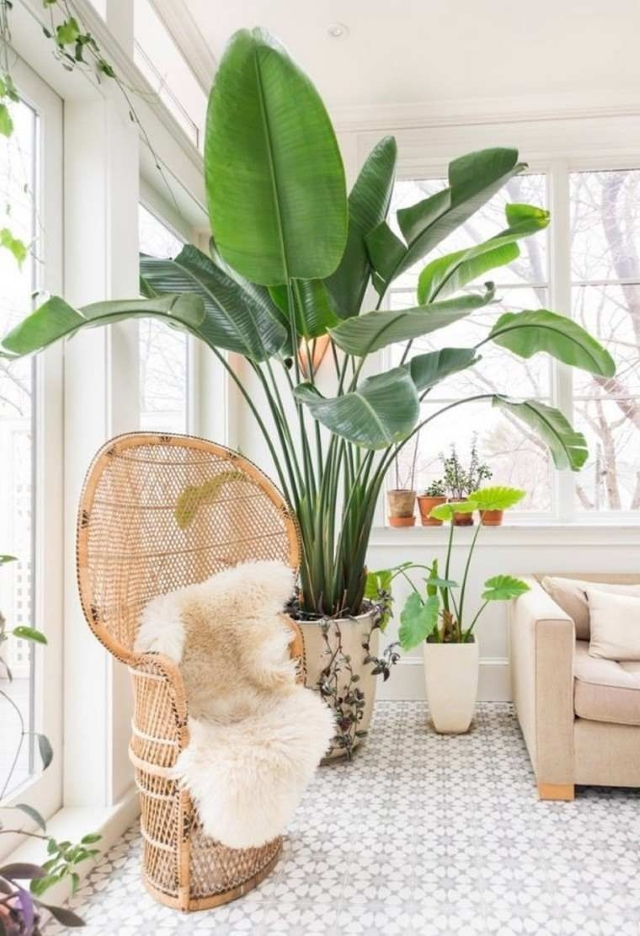

In [33]:
image_file = "plants/plant10.jpg"

image_view(image_file)

In [34]:
gpt4V_plant(image_file)

Analysis of image: plants/plant10.jpg

1. ITEM'S TYPE: Strelitzia Nicolai, commonly known as the Giant White Bird of Paradise or Wild Banana.
2. COLOR: Predominantly lush green.
3. COUNTRIES: Native to South Africa.
4. WATER: Prefers moist soil but is drought tolerant once established.
5. SUN: Thrives in full sun to partial shade.
6. TEMPERATURE: Prefers warm conditions, not tolerant to frost.
7. FERTILIZATION: Light feeding during the growing season.
8. DISEASE: Can be susceptible to root rot if overwatered and mealybugs.
9. SOIL: Rich, well-draining soil.
10. SOIL PH: Slightly acidic to neutral.
11. FLOWERING: Late winter to early spring.
12. TOXICITY: Mildly toxic to pets if ingested.
13. ITEM TYPE SPECIFIC: Has large, banana-like leaves. Can be grown indoors in a pot or outdoors in milder climates.
14. MISC.: Can grow up to 20 feet tall and spread 6 feet wide in the right conditions.
15. SIZE: Indoors it typically grows up to 6-8 feet tall, and the leaves can be several feet long.


### Another example

plants/plant11.jpg


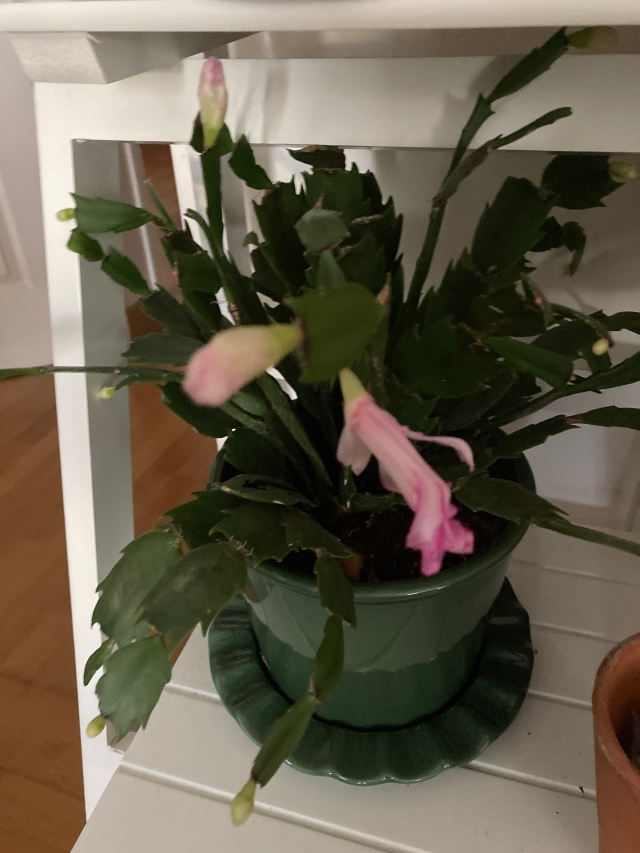

In [35]:
image_file = "plants/plant11.jpg"

image_view(image_file)

In [36]:
gpt4V_plant(image_file)

Analysis of image: plants/plant11.jpg

1. ITEM'S TYPE: This appears to be a Schlumbergera, commonly known as Christmas Cactus.
2. COLOR: The flowers are pink, and the foliage is a dark green.
3. COUNTRIES: Native to the coastal mountains of south-eastern Brazil.
4. WATER: Prefers evenly moist soil; not too dry or too wet.
5. SUN: Enjoys bright, indirect light.
6. TEMPERATURE: Thrives at 60-70°F (15-21°C) and above.
7. FERTILIZATION: Feed with a half-strength fertilizer every two weeks during the growing season.
8. DISEASE: Prone to root rot if overwatered, and may suffer from fungal diseases.
9. SOIL: Well-draining potting soil with good aeration.
10. SOIL PH: Prefers slightly acidic to neutral pH (5.5 to 6.2).
11. FLOWERING: Blooms in late fall to winter, hence the name Christmas Cactus.
12. TOXICITY: Non-toxic to cats and dogs.
13. ITEM TYPE SPECIFIC: Schlumbergera branches are leafless and made up of segments. It's known for its segmented stems and the flowers that appear at the tip

### Another example

plants/plant12.jpg


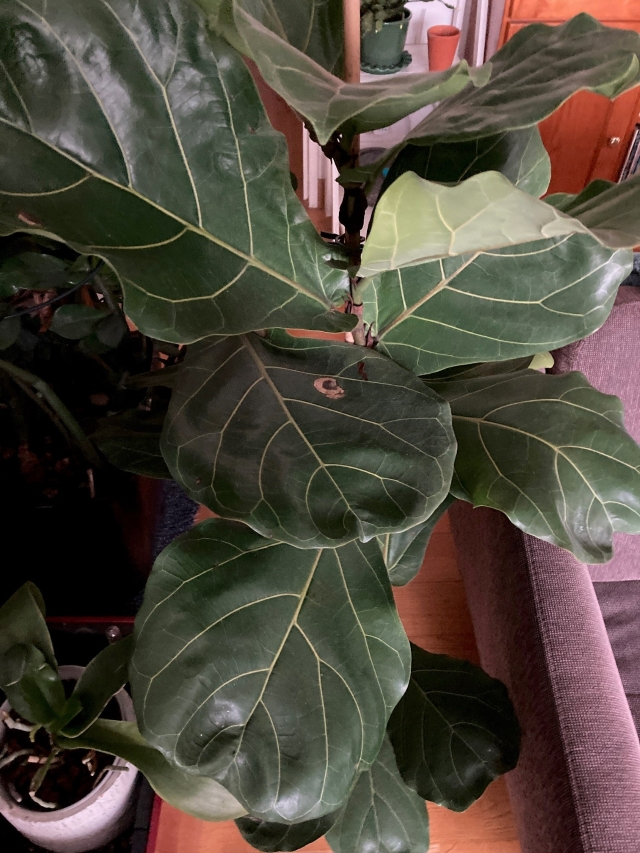

In [37]:
image_file = "plants/plant12.jpg"

image_view(image_file)

In [38]:
gpt4V_plant(image_file)

Analysis of image: plants/plant12.jpg

1. ITEM'S TYPE: This is a Fiddle Leaf Fig (Ficus lyrata).
2. COLOR: The main color is dark green with prominent veining in a lighter green.
3. COUNTRIES: Native to Western Africa.
4. WATER: Prefers moderate watering, allowing the top inch of soil to dry out between waterings.
5. SUN: Enjoys bright, indirect sunlight.
6. TEMPERATURE: Thrives in warm and humid conditions, ideally between 60-75°F (15-24°C).
7. FERTILIZATION: Benefits from fertilizing during the growing season (spring and summer).
8. DISEASE: Common issues include root rot, leaf spot, and bacterial infections.
9. SOIL: Well-draining potting mix is best.
10. SOIL PH: Prefers slightly acidic to neutral pH, around 6.0-7.0.
11. FLOWERING: Rarely flowers indoors; in its natural habitat, it may produce small green figs.
12. TOXICITY: Toxic to pets if ingested.
13. ITEM TYPE SPECIFIC: Known for its large, violin-shaped leaves which can be quite ornamental.
14. MISC.: Avoid moving the plant t

## 4. Gradio WebApp

In [41]:
def plant_copilot_fn(pil_image):
    """
    GPT4-Vision function
    """
    # Endpoint
    gpt4vision_endpoint = f"{openai.api_base}/openai/deployments/{model}/chat/completions?api-version=2023-12-01-preview"

    # Header
    headers = {"Content-Type": "application/json", "api-key": openai.api_key}

    # Encoded PIL image
    buffered = BytesIO()
    pil_image.save(buffered, format="JPEG")
    base_64_encoded_image = base64.b64encode(buffered.getvalue()).decode("ascii")

    context = """ 
    You are a plant and flowers expert, familiar with identifying plants and flowers from images.
    A user uploads an image and asks you to describe one particular piece in the shot: flowers, plants...
    """

    prompt = """
    You respond with your analysis of the following fields:

    1. ITEM'S TYPE: Identify the plant species.
    2. COLOR: Note the main color(s) and any secondary colors of the plant.
    3. COUNTRIES: Identify the country where this plant came from.
    4. WATER: Identify the water preferences of this plant.
    5. SUN: Identify the light preference of this plant.
    6. TEMPERATURE: Identify the best temperature for this plant.
    7. FERTILIZATION: What about fertilization?
    8. DISEASE: What are the main diseases for this plant?
    9. SOIL: What is the best soil?
    10. SOIL PH: What is the best soil PH?
    11. FLOWERING: What is the flowering period?
    12. TOXICITY: What is the toxicity?
    13. ITEM TYPE SPECIFIC: For each type of item, feel free to add any additional descriptions that are relevant \
    to help describe the item.
    14. MISC.: Anything else important that you notice about the plant.
    15. SIZE: What is the usual size of this plant?
    16. ITEM SUMMARY: Write a one-line summary for this item.
    17. ITEM CLASSIFICATION: Classify this item into "plant for beginners", "plant that needs attention", \
    "plant for experts".

    The output should be a numbered bulleted list.
    """

    # Prompt
    json_data = {
        "messages": [
            {"role": "system", "content": context},
            {"role": "user", "content": [prompt, {"image": base_64_encoded_image}]},
        ],
        "max_tokens": 4000,
        "temperature": 0.7,
    }

    # Results
    response = requests.post(
        gpt4vision_endpoint, headers=headers, data=json.dumps(json_data)
    )

    if response.status_code == 200:
        resp = json.loads(response.text)["choices"][0]["message"]["content"]
        return resp

    elif response.status_code == 429:
        msg = "[429 Error] Too many requests. Please wait a couple of seconds and try again."
        return msg

    else:
        msg = str(response.status_code)
        return msg

In [42]:
image_url = (
    "https://raw.githubusercontent.com/retkowsky/images/master/flower.jpg"
)
logo = "<center> <img src= {} width=70px></center>".format(image_url)
title = "Your plant Copilot with Azure Open AI GPT4 Turbo for Vision"
examples = glob.glob("plants/plant*.*")
inputs = gr.Image(type="pil", label="Your plant image").style(height=480)
outputs = [gr.Text(label="Plant image insights"),]

theme = "JohnSmith9982/small_and_pretty"
# https://huggingface.co/spaces/gradio/theme-gallery

plant_copilot_webapp = gr.Interface(
    fn=plant_copilot_fn,
    inputs=inputs,
    outputs=outputs,
    description=logo,
    title=title,
    examples=examples,
    theme=theme,
)

In [43]:
plant_copilot_webapp.launch(share=True)

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://bebc2f45e9a232ffb9.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces
